## **Using DCGAN to Generate Monet-style Images**

### **Problem description**
### Artists often have their own strong unique features when creating their artworks. If we can extract these features from their work, we can generate many artworks in those artists' style. The purpose of this project is to extract features from Monet photos and then use GAN to apply these features into new photos and create Monet-style images.

### **Data description**
### There are four subfolders provided: *'monet_jpg'*, *'monet_tfrec'*, *'photo_jpg'*, *'photo_tfrec'*. For this project, I will focus on 'monet_jpg' and 'photo_jpg'.

*   **monet_jpg**: 300 images
*   **photo_jpg**: 7038 images

In [ ]:
# IMPORTANT: SOME KAGGLE DATA SOURCES ARE PRIVATE
# RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES.
import kagglehub
kagglehub.login()


Kaggle credentials set.
Kaggle credentials successfully validated.


In [ ]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.

gan_getting_started_path = kagglehub.competition_download('gan-getting-started')

print('Data source import complete.')


100%|██████████| 367M/367M [00:03<00:00, 108MB/s]

Extracting files...


Data source import complete.


In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [ ]:
import os

print(gan_getting_started_path)                 # show folder path
print(os.listdir(gan_getting_started_path))     # list downloaded files

/root/.cache/kagglehub/competitions/gan-getting-started
['monet_jpg', 'monet_tfrec', 'photo_jpg', 'photo_tfrec']


## **Exploratory data analysis**
### I first calculate how many observations are in each dataset. Then, I visualized some random images from the two dataset I focused on. From monet paintings, we can see bright lights and colors in objects and landscapes. We can also see the brushstrokes. From the photos, we can see that these photos are about similar objects and landcapes and more clear than paintings. But when we see those photos, we know they do not represent Monet styles.


In [ ]:
import glob
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils

device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device:", device)

# Use your Kaggle path if available, otherwise default cache
try:
    BASE_KAGGLE = gan_getting_started_path
except NameError:
    BASE_KAGGLE = "/root/.cache/kagglehub/competitions/gan-getting-started"

print("Kaggle base path:", BASE_KAGGLE)
print("Subfolders:", os.listdir(BASE_KAGGLE))

MONET_DIR = os.path.join(BASE_KAGGLE, "monet_jpg")
PHOTO_DIR = os.path.join(BASE_KAGGLE, "photo_jpg")

print("Monet images:", len(os.listdir(MONET_DIR)))
print("Photo images:", len(os.listdir(PHOTO_DIR)))

Device: cuda
Kaggle base path: /root/.cache/kagglehub/competitions/gan-getting-started
Subfolders: ['monet_jpg', 'monet_tfrec', 'photo_jpg', 'photo_tfrec']
Monet images: 300
Photo images: 7038


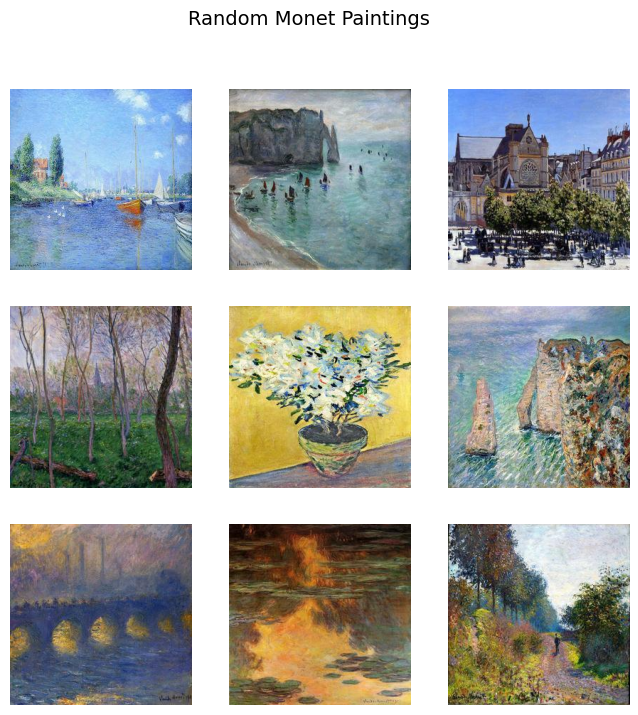

In [ ]:
import random

files = os.listdir(MONET_DIR)
sample_files = random.sample(files, 9)  # show 9 images

plt.figure(figsize=(8,8))
for i, fname in enumerate(sample_files):
    img = Image.open(os.path.join(MONET_DIR, fname))
    plt.subplot(3,3,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.suptitle("Random Monet Paintings", fontsize=14)
plt.show()

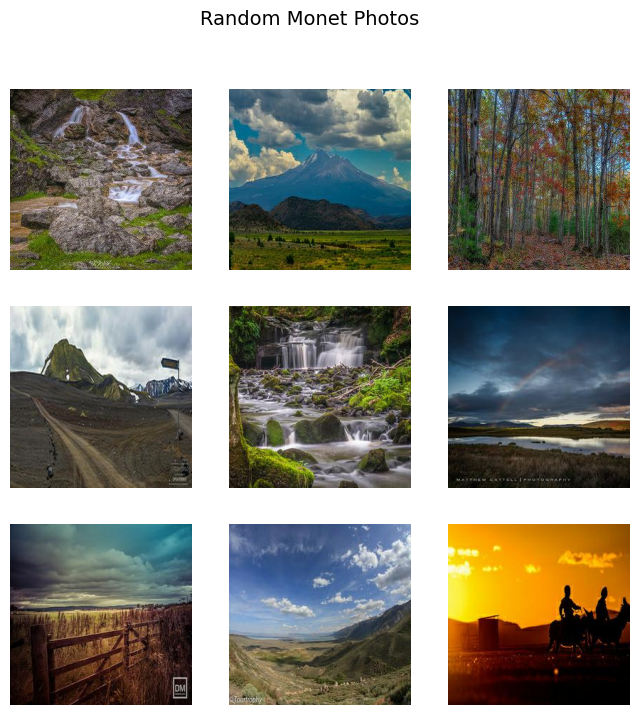

In [ ]:
files = os.listdir(PHOTO_DIR)
sample_files = random.sample(files, 9)  # show 9 images

plt.figure(figsize=(8,8))
for i, fname in enumerate(sample_files):
    img = Image.open(os.path.join(PHOTO_DIR, fname))
    plt.subplot(3,3,i+1)
    plt.imshow(img)
    plt.axis("off")

plt.suptitle("Random Monet Photos", fontsize=14)
plt.show()

## **Model architecture**
### DCGAN consist of two competing models—a generator that learns to create realistic images from random noise, and a discriminator that learns to differentiate real images from generated ones. This DCGAN operates on 64×64 RGB images. The generator transforms a 100-dimensional noise vector into an image through five transposed convolution layers, gradually expanding from 4×4 to 64×64. Each layer uses BatchNorm and ReLU, and the final output applies Tanh to match normalized pixel values. The discriminator mirrors this structure using downsampling convolutions with LeakyReLU and BatchNorm, compressing a 64×64 image to a single authenticity logit. Both networks follow standard DCGAN weight initialization (N(0,0.02)), and images are resized, normalized, and loaded. For the generated images, we resized to 256x256 for submission.

## **Hyperparameter tuning**
### The model uses a latent dimension of 100, batch size of 128, and 150 training epochs. We adjusted several hyperparameters, including loss function, learning rate and epochs, to improve stability. Instead of the standard BCE loss, we applied MSELoss (LSGAN-style) to produce smoother gradients and reduce training oscillation. The learning rate was also tuned. Finally, I looked at FID to choose the best hyperparameters.

In [ ]:
IMG_SIZE = 64   # image size suitable for DCGAN

transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.CenterCrop(IMG_SIZE),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)   # normalize [0,1] → [-1,1]
])

class ImageFolderSimple(Dataset):
    def __init__(self, img_dir, transform=None):
        self.paths = sorted(glob.glob(os.path.join(img_dir, "*.jpg")))
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img


train_dir = MONET_DIR

dataset = ImageFolderSimple(train_dir, transform)
batch_size = 128

loader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=2, drop_last=True)
print("Batches per epoch:", len(loader))

Batches per epoch: 2


In [ ]:
z_dim = 100
ngf = 64   # generator feature maps
ndf = 64   # discriminator feature maps
nc = 3     # channels

# Generator
class Generator(nn.Module):
    def __init__(self, z_dim, ngf, nc):
        super().__init__()
        self.net = nn.Sequential(
            # input: Z → (ngf*8) x 4 x 4
            nn.ConvTranspose2d(z_dim, ngf*8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf*8),
            nn.ReLU(True),

            # (ngf*8) x 4x4 → (ngf*4) x 8x8
            nn.ConvTranspose2d(ngf*8, ngf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*4),
            nn.ReLU(True),

            # (ngf*4) x 8x8 → (ngf*2) x 16x16
            nn.ConvTranspose2d(ngf*4, ngf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf*2),
            nn.ReLU(True),

            # (ngf*2) x 16x16 → (ngf) x 32x32
            nn.ConvTranspose2d(ngf*2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),

            # (ngf) x 32x32 → nc x 64x64
            nn.ConvTranspose2d(ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()   # output in [-1,1]
        )

    def forward(self, z):
        return self.net(z)

# Discriminator
class Discriminator(nn.Module):
    def __init__(self, ndf, nc):
        super().__init__()
        self.net = nn.Sequential(
            # nc x 64x64 → (ndf) x 32x32
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            # (ndf) x 32x32 → (ndf*2) x 16x16
            nn.Conv2d(ndf, ndf*2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*2),
            nn.LeakyReLU(0.2, inplace=True),

            # (ndf*2) x 16x16 → (ndf*4) x 8x8
            nn.Conv2d(ndf*2, ndf*4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*4),
            nn.LeakyReLU(0.2, inplace=True),

            # (ndf*4) x 8x8 → (ndf*8) x 4x4
            nn.Conv2d(ndf*4, ndf*8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf*8),
            nn.LeakyReLU(0.2, inplace=True),

            # (ndf*8) x 4x4 → 1 x 1 x 1
            nn.Conv2d(ndf*8, 1, 4, 1, 0, bias=False),
        )

    def forward(self, x):
        return self.net(x).view(-1)  # logits

In [ ]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

G = Generator(z_dim, ngf, nc).to(device)
D = Discriminator(ndf, nc).to(device)

G.apply(weights_init)
D.apply(weights_init)

print("Generator params:", sum(p.numel() for p in G.parameters())/1e6, "M")
print("Discriminator params:", sum(p.numel() for p in D.parameters())/1e6, "M")

Generator params: 3.576704 M
Discriminator params: 2.765568 M


Epoch [1/150] Batch [0/2] LossD: 0.063  LossG: 0.901
Epoch [2/150] Batch [0/2] LossD: 0.134  LossG: 1.530
Epoch [3/150] Batch [0/2] LossD: 0.074  LossG: 0.980
Epoch [4/150] Batch [0/2] LossD: 0.069  LossG: 1.155
Epoch [5/150] Batch [0/2] LossD: 0.046  LossG: 0.940
Epoch [6/150] Batch [0/2] LossD: 0.052  LossG: 1.409
Epoch [7/150] Batch [0/2] LossD: 0.138  LossG: 1.788
Epoch [8/150] Batch [0/2] LossD: 0.147  LossG: 1.553
Epoch [9/150] Batch [0/2] LossD: 0.041  LossG: 0.990
Epoch [10/150] Batch [0/2] LossD: 0.047  LossG: 1.031
Epoch [11/150] Batch [0/2] LossD: 0.037  LossG: 0.950
Epoch [12/150] Batch [0/2] LossD: 0.051  LossG: 0.663
Epoch [13/150] Batch [0/2] LossD: 0.096  LossG: 0.546
Epoch [14/150] Batch [0/2] LossD: 0.077  LossG: 0.895
Epoch [15/150] Batch [0/2] LossD: 0.044  LossG: 0.906
Epoch [16/150] Batch [0/2] LossD: 0.047  LossG: 0.739
Epoch [17/150] Batch [0/2] LossD: 0.368  LossG: 0.175
Epoch [18/150] Batch [0/2] LossD: 0.297  LossG: 0.616
Epoch [19/150] Batch [0/2] LossD: 0.1

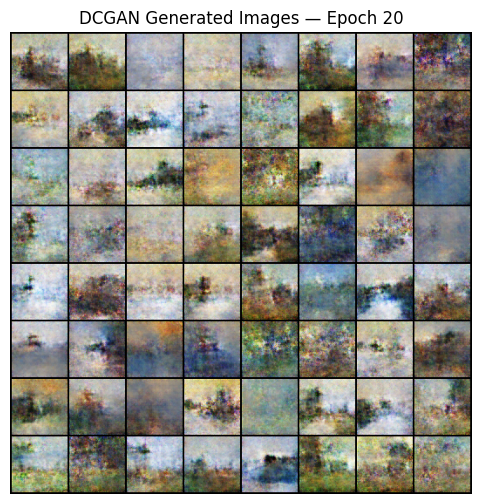

Epoch [21/150] Batch [0/2] LossD: 0.051  LossG: 0.819
Epoch [22/150] Batch [0/2] LossD: 0.050  LossG: 1.624
Epoch [23/150] Batch [0/2] LossD: 0.120  LossG: 1.373
Epoch [24/150] Batch [0/2] LossD: 0.056  LossG: 1.140
Epoch [25/150] Batch [0/2] LossD: 0.032  LossG: 0.831
Epoch [26/150] Batch [0/2] LossD: 0.035  LossG: 0.901
Epoch [27/150] Batch [0/2] LossD: 0.037  LossG: 1.246
Epoch [28/150] Batch [0/2] LossD: 0.059  LossG: 1.319
Epoch [29/150] Batch [0/2] LossD: 0.057  LossG: 0.994
Epoch [30/150] Batch [0/2] LossD: 0.041  LossG: 1.234
Epoch [31/150] Batch [0/2] LossD: 0.101  LossG: 1.746
Epoch [32/150] Batch [0/2] LossD: 0.133  LossG: 1.613
Epoch [33/150] Batch [0/2] LossD: 0.071  LossG: 1.087
Epoch [34/150] Batch [0/2] LossD: 0.041  LossG: 1.053
Epoch [35/150] Batch [0/2] LossD: 0.052  LossG: 0.706
Epoch [36/150] Batch [0/2] LossD: 0.073  LossG: 0.724
Epoch [37/150] Batch [0/2] LossD: 0.132  LossG: 0.279
Epoch [38/150] Batch [0/2] LossD: 0.244  LossG: 0.432
Epoch [39/150] Batch [0/2] L

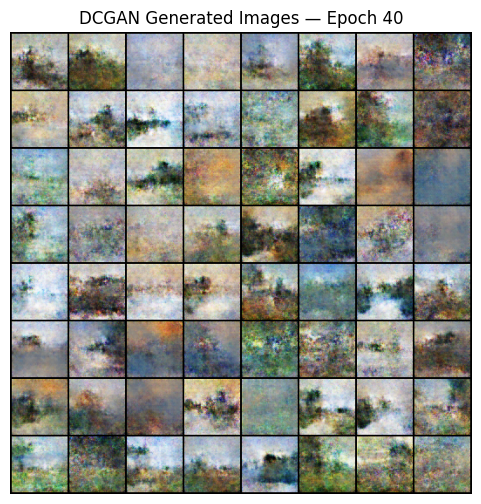

Epoch [41/150] Batch [0/2] LossD: 0.046  LossG: 1.098
Epoch [42/150] Batch [0/2] LossD: 0.038  LossG: 0.895
Epoch [43/150] Batch [0/2] LossD: 0.075  LossG: 0.635
Epoch [44/150] Batch [0/2] LossD: 0.141  LossG: 0.536
Epoch [45/150] Batch [0/2] LossD: 0.118  LossG: 0.657
Epoch [46/150] Batch [0/2] LossD: 0.058  LossG: 0.716
Epoch [47/150] Batch [0/2] LossD: 0.047  LossG: 0.719
Epoch [48/150] Batch [0/2] LossD: 0.081  LossG: 0.749
Epoch [49/150] Batch [0/2] LossD: 0.057  LossG: 0.944
Epoch [50/150] Batch [0/2] LossD: 0.071  LossG: 1.836
Epoch [51/150] Batch [0/2] LossD: 0.286  LossG: 2.417
Epoch [52/150] Batch [0/2] LossD: 0.398  LossG: 2.844
Epoch [53/150] Batch [0/2] LossD: 0.469  LossG: 3.043
Epoch [54/150] Batch [0/2] LossD: 0.326  LossG: 2.004
Epoch [55/150] Batch [0/2] LossD: 0.147  LossG: 0.622
Epoch [56/150] Batch [0/2] LossD: 0.055  LossG: 1.195
Epoch [57/150] Batch [0/2] LossD: 0.054  LossG: 1.029
Epoch [58/150] Batch [0/2] LossD: 0.041  LossG: 1.100
Epoch [59/150] Batch [0/2] L

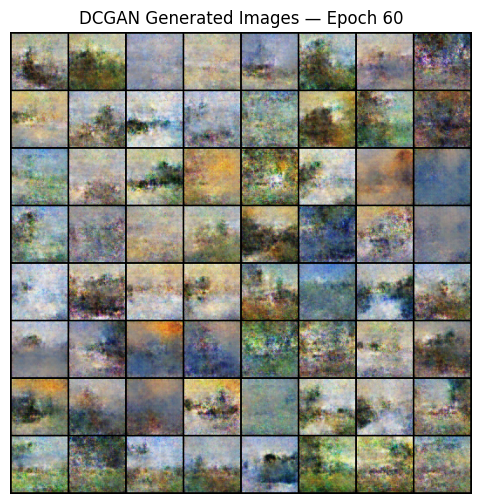

Epoch [61/150] Batch [0/2] LossD: 0.043  LossG: 1.005
Epoch [62/150] Batch [0/2] LossD: 0.041  LossG: 0.876
Epoch [63/150] Batch [0/2] LossD: 0.035  LossG: 1.081
Epoch [64/150] Batch [0/2] LossD: 0.036  LossG: 1.135
Epoch [65/150] Batch [0/2] LossD: 0.043  LossG: 1.452
Epoch [66/150] Batch [0/2] LossD: 0.176  LossG: 1.709
Epoch [67/150] Batch [0/2] LossD: 0.126  LossG: 1.142
Epoch [68/150] Batch [0/2] LossD: 0.036  LossG: 0.830
Epoch [69/150] Batch [0/2] LossD: 0.040  LossG: 0.970
Epoch [70/150] Batch [0/2] LossD: 0.050  LossG: 0.976
Epoch [71/150] Batch [0/2] LossD: 0.044  LossG: 1.143
Epoch [72/150] Batch [0/2] LossD: 0.040  LossG: 1.133
Epoch [73/150] Batch [0/2] LossD: 0.042  LossG: 1.324
Epoch [74/150] Batch [0/2] LossD: 0.035  LossG: 0.891
Epoch [75/150] Batch [0/2] LossD: 0.049  LossG: 0.683
Epoch [76/150] Batch [0/2] LossD: 0.057  LossG: 0.759
Epoch [77/150] Batch [0/2] LossD: 0.051  LossG: 0.769
Epoch [78/150] Batch [0/2] LossD: 0.137  LossG: 0.371
Epoch [79/150] Batch [0/2] L

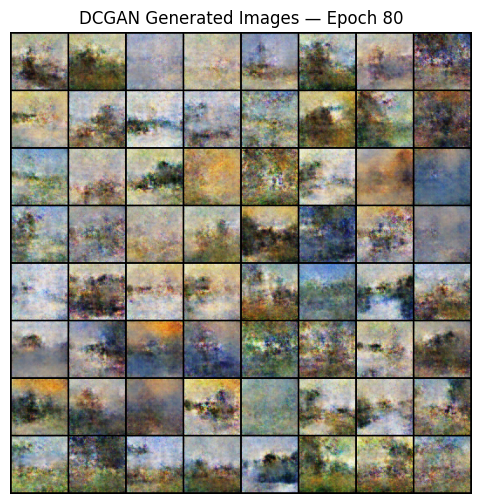

Epoch [81/150] Batch [0/2] LossD: 0.052  LossG: 1.141
Epoch [82/150] Batch [0/2] LossD: 0.041  LossG: 0.896
Epoch [83/150] Batch [0/2] LossD: 0.035  LossG: 1.073
Epoch [84/150] Batch [0/2] LossD: 0.038  LossG: 1.006
Epoch [85/150] Batch [0/2] LossD: 0.041  LossG: 0.876
Epoch [86/150] Batch [0/2] LossD: 0.036  LossG: 0.949
Epoch [87/150] Batch [0/2] LossD: 0.030  LossG: 1.159
Epoch [88/150] Batch [0/2] LossD: 0.042  LossG: 1.114
Epoch [89/150] Batch [0/2] LossD: 0.065  LossG: 0.611
Epoch [90/150] Batch [0/2] LossD: 0.142  LossG: 0.568
Epoch [91/150] Batch [0/2] LossD: 0.129  LossG: 0.488
Epoch [92/150] Batch [0/2] LossD: 0.160  LossG: 0.569
Epoch [93/150] Batch [0/2] LossD: 0.087  LossG: 0.650
Epoch [94/150] Batch [0/2] LossD: 0.074  LossG: 1.049
Epoch [95/150] Batch [0/2] LossD: 0.054  LossG: 1.387
Epoch [96/150] Batch [0/2] LossD: 0.111  LossG: 1.470
Epoch [97/150] Batch [0/2] LossD: 0.068  LossG: 0.989
Epoch [98/150] Batch [0/2] LossD: 0.047  LossG: 0.916
Epoch [99/150] Batch [0/2] L

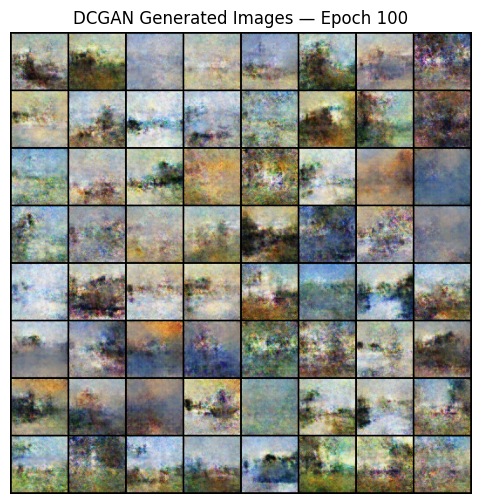

Epoch [101/150] Batch [0/2] LossD: 0.058  LossG: 1.343
Epoch [102/150] Batch [0/2] LossD: 0.104  LossG: 1.676
Epoch [103/150] Batch [0/2] LossD: 0.065  LossG: 1.228
Epoch [104/150] Batch [0/2] LossD: 0.041  LossG: 1.198
Epoch [105/150] Batch [0/2] LossD: 0.078  LossG: 1.338
Epoch [106/150] Batch [0/2] LossD: 0.037  LossG: 0.937
Epoch [107/150] Batch [0/2] LossD: 0.042  LossG: 0.911
Epoch [108/150] Batch [0/2] LossD: 0.027  LossG: 1.076
Epoch [109/150] Batch [0/2] LossD: 0.028  LossG: 1.314
Epoch [110/150] Batch [0/2] LossD: 0.051  LossG: 1.277
Epoch [111/150] Batch [0/2] LossD: 0.047  LossG: 1.404
Epoch [112/150] Batch [0/2] LossD: 0.063  LossG: 1.490
Epoch [113/150] Batch [0/2] LossD: 0.081  LossG: 1.198
Epoch [114/150] Batch [0/2] LossD: 0.055  LossG: 0.988
Epoch [115/150] Batch [0/2] LossD: 0.043  LossG: 0.829
Epoch [116/150] Batch [0/2] LossD: 0.046  LossG: 0.832
Epoch [117/150] Batch [0/2] LossD: 0.056  LossG: 1.443
Epoch [118/150] Batch [0/2] LossD: 0.182  LossG: 2.053
Epoch [119

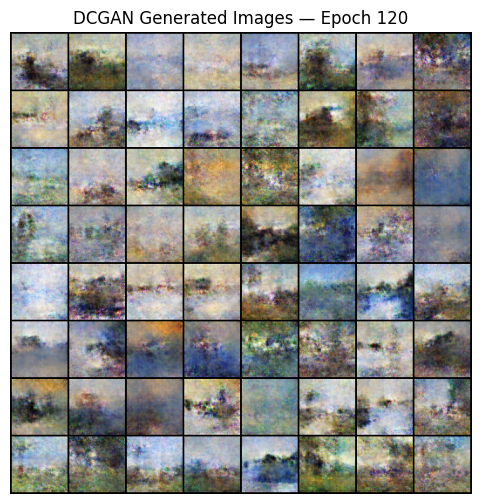

Epoch [121/150] Batch [0/2] LossD: 0.094  LossG: 1.022
Epoch [122/150] Batch [0/2] LossD: 0.050  LossG: 1.023
Epoch [123/150] Batch [0/2] LossD: 0.065  LossG: 1.379
Epoch [124/150] Batch [0/2] LossD: 0.087  LossG: 1.451
Epoch [125/150] Batch [0/2] LossD: 0.034  LossG: 0.903
Epoch [126/150] Batch [0/2] LossD: 0.030  LossG: 0.834
Epoch [127/150] Batch [0/2] LossD: 0.060  LossG: 0.744
Epoch [128/150] Batch [0/2] LossD: 0.039  LossG: 1.103
Epoch [129/150] Batch [0/2] LossD: 0.041  LossG: 1.268
Epoch [130/150] Batch [0/2] LossD: 0.041  LossG: 1.058
Epoch [131/150] Batch [0/2] LossD: 0.034  LossG: 1.159
Epoch [132/150] Batch [0/2] LossD: 0.052  LossG: 1.311
Epoch [133/150] Batch [0/2] LossD: 0.038  LossG: 1.120
Epoch [134/150] Batch [0/2] LossD: 0.050  LossG: 0.927
Epoch [135/150] Batch [0/2] LossD: 0.041  LossG: 0.808
Epoch [136/150] Batch [0/2] LossD: 0.080  LossG: 0.565
Epoch [137/150] Batch [0/2] LossD: 0.065  LossG: 0.731
Epoch [138/150] Batch [0/2] LossD: 0.035  LossG: 1.161
Epoch [139

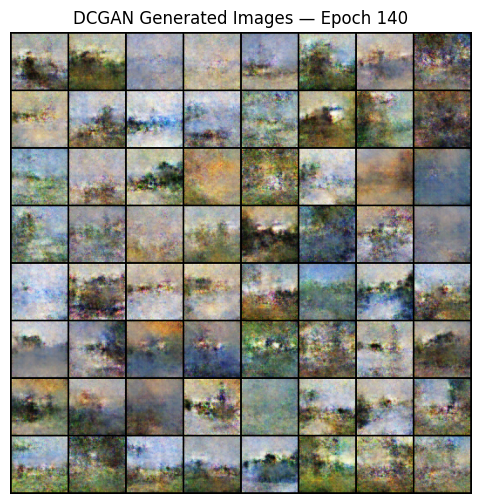

Epoch [141/150] Batch [0/2] LossD: 0.046  LossG: 0.920
Epoch [142/150] Batch [0/2] LossD: 0.072  LossG: 0.587
Epoch [143/150] Batch [0/2] LossD: 0.082  LossG: 0.779
Epoch [144/150] Batch [0/2] LossD: 0.038  LossG: 1.288
Epoch [145/150] Batch [0/2] LossD: 0.038  LossG: 1.195
Epoch [146/150] Batch [0/2] LossD: 0.047  LossG: 1.293
Epoch [147/150] Batch [0/2] LossD: 0.069  LossG: 0.996
Epoch [148/150] Batch [0/2] LossD: 0.083  LossG: 0.610
Epoch [149/150] Batch [0/2] LossD: 0.168  LossG: 0.450
Epoch [150/150] Batch [0/2] LossD: 0.121  LossG: 0.712


In [ ]:
#criterion = nn.BCEWithLogitsLoss()     # try different loss function
criterion = nn.MSELoss()
#lr = 2e-4                              # try different learning rate
lr = 1e-4
beta1 = 0.5

optD = torch.optim.Adam(D.parameters(), lr=lr, betas=(beta1, 0.999))
optG = torch.optim.Adam(G.parameters(), lr=lr, betas=(beta1, 0.999))

fixed_noise = torch.randn(64, z_dim, 1, 1, device=device)
epochs = 150                            # try different epochs

def denorm(x):
    # [-1,1] -> [0,1]
    return (x + 1) / 2

for epoch in range(epochs):
    for i, real in enumerate(loader):
        real = real.to(device)
        bsz = real.size(0)

        # ========= Train Discriminator =========
        noise = torch.randn(bsz, z_dim, 1, 1, device=device)
        fake = G(noise).detach()

        # real labels = 1, fake labels = 0
        real_logits = D(real)
        fake_logits = D(fake)

        real_labels = torch.ones_like(real_logits, device=device)
        fake_labels = torch.zeros_like(fake_logits, device=device)

        lossD_real = criterion(real_logits, real_labels)
        lossD_fake = criterion(fake_logits, fake_labels)
        lossD = (lossD_real + lossD_fake) / 2

        optD.zero_grad()
        lossD.backward()
        optD.step()

        # ========= Train Generator =========
        noise = torch.randn(bsz, z_dim, 1, 1, device=device)
        fake = G(noise)
        fake_logits = D(fake)
        # want D(fake) → 1
        lossG = criterion(fake_logits, real_labels)

        optG.zero_grad()
        lossG.backward()
        optG.step()

        if i % 50 == 0:
            print(f"Epoch [{epoch+1}/{epochs}] Batch [{i}/{len(loader)}] "
                  f"LossD: {lossD.item():.3f}  LossG: {lossG.item():.3f}")

    # show samples after each epoch
    if (epoch+1) % 20 == 0:
        with torch.no_grad():
            fake_samples = G(fixed_noise).cpu()
        grid = utils.make_grid(denorm(fake_samples), nrow=8)

        plt.figure(figsize=(6,6))
        plt.imshow(np.transpose(grid.numpy(), (1,2,0)))
        plt.axis("off")
        plt.title(f"DCGAN Generated Images — Epoch {epoch+1}")
        plt.show()

In [ ]:
from torchvision.models import inception_v3, Inception_V3_Weights

import scipy.linalg  # for sqrtm in FID

In [ ]:
class ImageFolderSimple(Dataset):
    def __init__(self, img_dir, transform=None):
        self.paths = sorted(glob.glob(os.path.join(img_dir, "*.jpg")))
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        img = Image.open(self.paths[idx]).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
print("Device for FID:", device)

weights = Inception_V3_Weights.IMAGENET1K_V1
inception = inception_v3(weights=weights, transform_input=False).to(device)
inception.fc = nn.Identity()
inception.eval()

# Transform expected by Inception weights
inception_transform = transforms.Compose([
    transforms.Resize((299, 299)),
    transforms.ToTensor(),
    transforms.Normalize(mean=weights.transforms().mean,
                         std=weights.transforms().std)
])

Device for FID: cuda


In [ ]:
def get_activations_real(monet_dir, inception, batch_size=32, n_samples=1000):
    dataset = ImageFolderSimple(monet_dir, transform=inception_transform)
    loader = DataLoader(dataset, batch_size=batch_size,
                        shuffle=True, num_workers=2, drop_last=False)

    feats = []
    total = 0

    with torch.no_grad():
        for imgs in loader:
            imgs = imgs.to(device)
            pred = inception(imgs)   # (B, 2048)
            feats.append(pred.cpu().numpy())
            total += imgs.size(0)
            if total >= n_samples:
                break

    feats = np.concatenate(feats, axis=0)[:n_samples]
    print("Real activations shape:", feats.shape)
    return feats

In [ ]:
to_pil = transforms.ToPILImage()

def get_activations_fake(G, inception, z_dim, batch_size=32, n_samples=1000):
    G.eval()
    feats = []
    total = 0

    with torch.no_grad():
        while total < n_samples:
            z = torch.randn(batch_size, z_dim, 1, 1, device=device)
            fake = G(z).cpu()
            fake = (fake + 1) / 2

            imgs_proc = []
            for img in fake:
                img_pil = to_pil(img)
                img_t = inception_transform(img_pil)
                imgs_proc.append(img_t)

            imgs_proc = torch.stack(imgs_proc).to(device)
            pred = inception(imgs_proc)
            feats.append(pred.cpu().numpy())
            total += imgs_proc.size(0)

    feats = np.concatenate(feats, axis=0)[:n_samples]
    print("Fake activations shape:", feats.shape)
    return feats

In [ ]:
def calculate_fid(act_real, act_fake):               # calculate FID
    mu_real = act_real.mean(axis=0)
    mu_fake = act_fake.mean(axis=0)

    sigma_real = np.cov(act_real, rowvar=False)
    sigma_fake = np.cov(act_fake, rowvar=False)

    diff = mu_real - mu_fake

    covmean, _ = scipy.linalg.sqrtm(sigma_real.dot(sigma_fake), disp=False)
    if np.iscomplexobj(covmean):
        covmean = covmean.real

    fid = diff.dot(diff) + np.trace(sigma_real + sigma_fake - 2 * covmean)
    return fid

In [ ]:
N_SAMPLES = 500             # choose 500 because it is easier to run; might change to other numbers

real_acts = get_activations_real(MONET_DIR, inception, batch_size=32, n_samples=N_SAMPLES)
fake_acts = get_activations_fake(G, inception, z_dim, batch_size=32, n_samples=N_SAMPLES)

fid_value = calculate_fid(real_acts, fake_acts)
print(f"FID (real Monet vs DCGAN fake): {fid_value:.2f}")

Real activations shape: (300, 2048)
Fake activations shape: (500, 2048)


/tmp/ipython-input-2853580708.py:10: DeprecationWarning: The `disp` argument is deprecated and will be removed in SciPy 1.18.0.
  covmean, _ = scipy.linalg.sqrtm(sigma_real.dot(sigma_fake), disp=False)


FID (real Monet vs DCGAN fake): 280.82


In [ ]:
import pandas as pd                    # hyperparamter tuning

results = {
    "Run": ["A", "B", "C"],
    "Loss": ["MSE", "BCE", "MSE"],
    "Learning Rate": [1e-4, 2e-4, 2e-4],
    "Epochs": [150, 150, 200],
    "FID ↓": [280.82, 284.43, 337.84]
}

df = pd.DataFrame(results)
df

,Run,Loss,Learning Rate,Epochs,FID ↓
0,A,MSE,0.0001,150,280.82
1,B,BCE,0.0002,150,284.43
2,C,MSE,0.0002,200,337.84


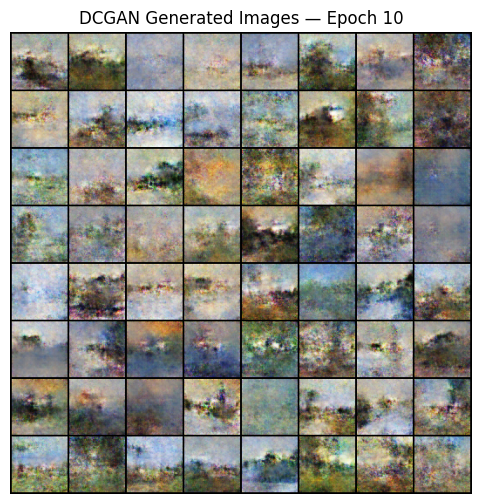

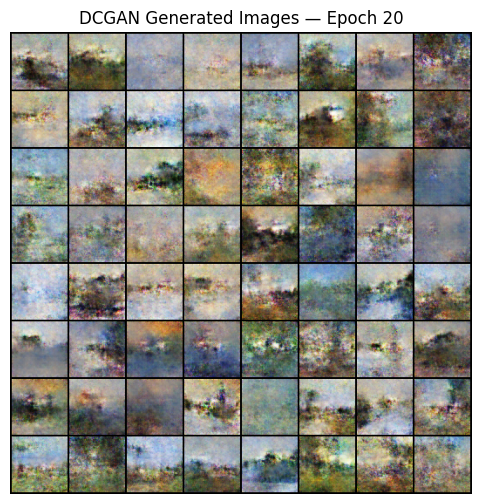

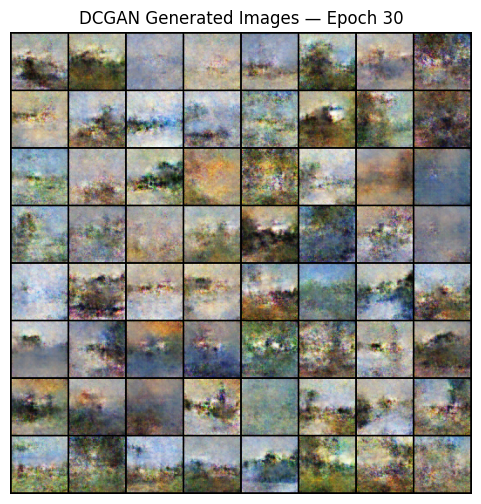

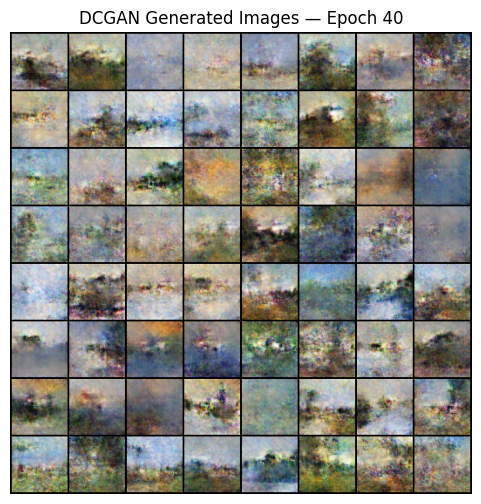

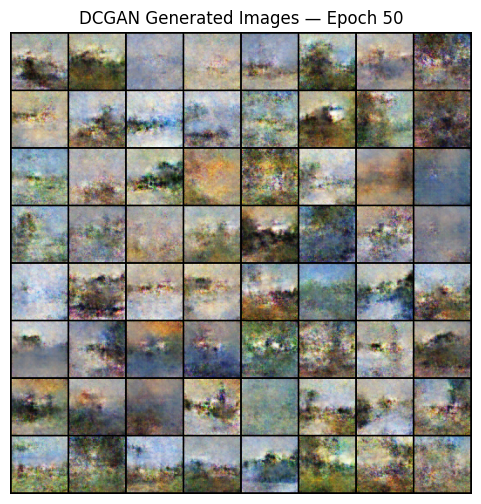

...

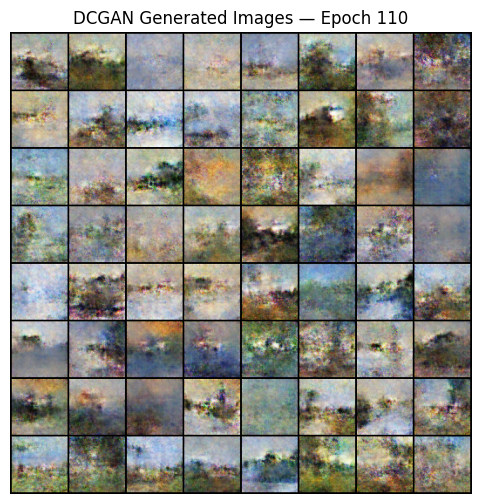

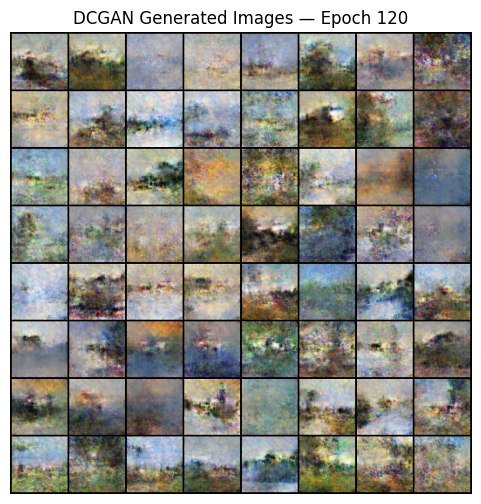

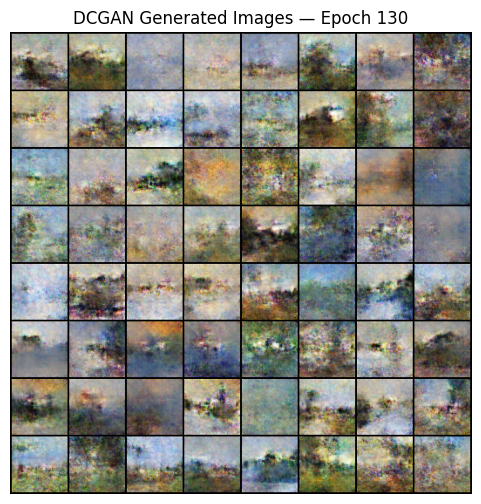

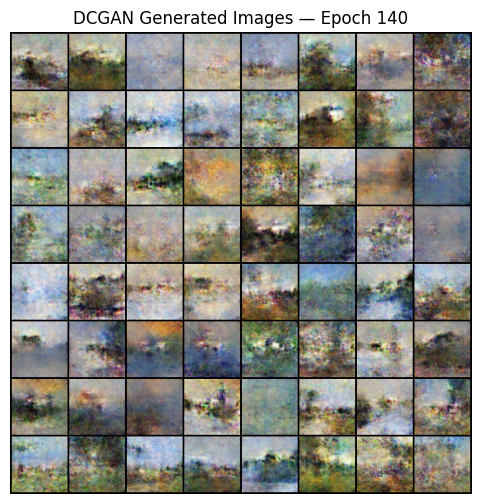

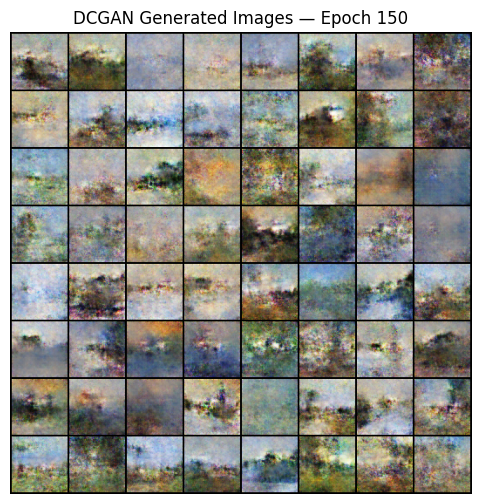

In [ ]:
# visualize some generated images
from torchvision import utils

for epoch in range(epochs):
    ...
    if (epoch+1) % 10 == 0:
        with torch.no_grad():
            fake_samples = G(fixed_noise).cpu()
        grid = utils.make_grid(denorm(fake_samples), nrow=8)

        # show current epoch
        plt.figure(figsize=(6,6))
        plt.imshow(np.transpose(grid.numpy(), (1,2,0)))
        plt.axis("off")
        plt.title(f"DCGAN Generated Images — Epoch {epoch+1}")
        plt.show()

        # this line actually saves the image
        plt.imsave(f"dcgan_samples_epoch{epoch+1}.png",
                   np.transpose(grid.numpy(), (1,2,0)))

In [ ]:
import math

# Make output folder
out_dir = "images"
os.makedirs(out_dir, exist_ok=True)

def denorm(x):
    return (x + 1) / 2  # [-1,1] -> [0,1]

total_images = 7000    # generate images
batch_size = 32

G.eval()
idx = 0

with torch.no_grad():
    while idx < total_images:
        current_bs = min(batch_size, total_images - idx)
        noise = torch.randn(current_bs, z_dim, 1, 1, device=device)
        fake = G(noise).cpu()              # (B,3,H,W) in [-1,1]
        fake = denorm(fake)                # -> [0,1]

        for j in range(current_bs):
            img = fake[j]
            np_img = (img.numpy().transpose(1, 2, 0) * 255.0).clip(0, 255).astype(np.uint8)

            pil_img = Image.fromarray(np_img)
            # resize to 256x256 (from 64x64)
            pil_img = pil_img.resize((256, 256), Image.BICUBIC)

            pil_img.save(os.path.join(out_dir, f"{idx}.jpg"), quality=95)
            idx += 1

        print(f"Generated {idx}/{total_images} images")

print("Done generating images.")

Generated 32/7000 images
Generated 64/7000 images
Generated 96/7000 images
Generated 128/7000 images
Generated 160/7000 images
Generated 192/7000 images
Generated 224/7000 images
Generated 256/7000 images
Generated 288/7000 images
Generated 320/7000 images
Generated 352/7000 images
Generated 384/7000 images
Generated 416/7000 images
Generated 448/7000 images
Generated 480/7000 images
Generated 512/7000 images
Generated 544/7000 images
Generated 576/7000 images
Generated 608/7000 images
Generated 640/7000 images
Generated 672/7000 images
Generated 704/7000 images
Generated 736/7000 images
Generated 768/7000 images
Generated 800/7000 images
Generated 832/7000 images
Generated 864/7000 images
Generated 896/7000 images
Generated 928/7000 images
Generated 960/7000 images
Generated 992/7000 images
Generated 1024/7000 images
Generated 1056/7000 images
Generated 1088/7000 images
Generated 1120/7000 images
Generated 1152/7000 images
Generated 1184/7000 images
Generated 1216/7000 images
Generate

In [ ]:
import imghdr
print(imghdr.what("images/0.jpg"))   # check whether it prints jpg

jpeg


/tmp/ipython-input-335661142.py:1: DeprecationWarning: 'imghdr' is deprecated and slated for removal in Python 3.13
  import imghdr


In [ ]:
import shutil

shutil.make_archive("images", "zip", out_dir)
print("Created images.zip")

Created images.zip


In [ ]:
from google.colab import files
files.download("images.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## **Analysis and result**

### I tried different combinations of hyperparamters and I finally chose MSE, 1e-4, and 150 epochs as the model to generate images base on FID (the smaller, the better).

| Run | Loss | Learning Rate | Epochs | FID   |
|-----|------|----------------|--------|--------|
| A   | MSE  | 1e-4           | 150    | 280.82 |
| B   | BCE  | 2e-4           | 150    | 284.43 |
| C   | MSE  | 2e-4           | 200    | 337.84 |

## **Learning and Takeways**

### There are several learnings and takeways:
*   Generally speaking, if you choose higher epochs, more features will show up and the images become clearer.
*   Loss function: MSE can outperform BCE perhaps because MSE keeps penalizing the distance between D(fake) and the target (e.g., 1) in a more linear way, so the generator still gets useful gradients even when D is strong.
*   Learning rate: for 1e-4, updates are smaller and more stable; GANs are very sensitive to learning rates.

## **Ways to improve**
*   It would be better to have complete plan for hyperparameter tuning beyond learning rate, loss function, epochs.
*   If GPU resources allow, try more epochs.

## **Competition result**

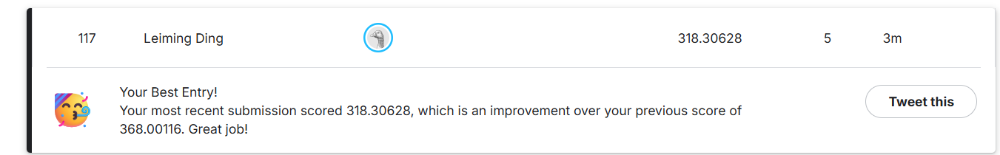
